In [51]:
using Plots
using LinearAlgebra
using LaTeXStrings
using StatsBase
using CSV
using DataFrames

In [52]:
t_start = time();

## Parameters:

In [53]:
t0 = 1.0;
t = 1.0;
t_prime = 1.5;
m_0 = 3;
x_periodic = 0;
y_periodic = 0;

L = 120;

Lx = L;
Ly = L;

exportdata=0;

Equation of two lines are $y = mx + c_1$ and $y = mx + c_2$

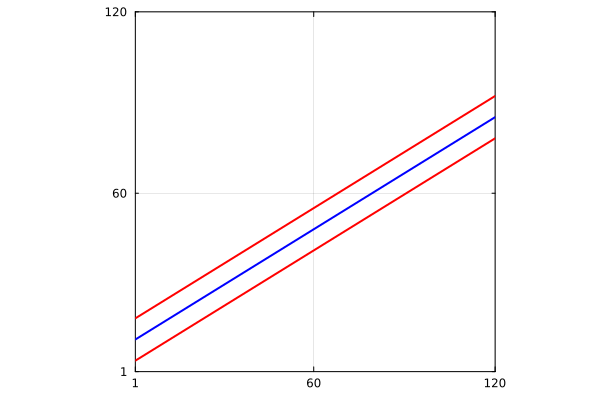

In [54]:
m = (-1+sqrt(5))/2
#m=2/3
c1 = 4
c2 = 18

function line_down(x::Float64)
    return c1 + m*x
end

function line_up(x::Float64)
    return c2 + m*x
end

function line_middle(x::Float64)
    return (line_up(x) + line_down(x))/2
end

line_x = [1.0,L]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plot(line_x,line_down_y,color="red",width=2, xlims=(1,Lx),ylims=(1,Ly),legend=:none,aspect_ratio=:equal,frame=:box, framestyle=:thick,xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly])
plot!(line_x,line_up_y,color="red",width=2)
plot!(line_x,line_middle.(line_x),color="blue",width=2)

In [55]:
points_x_array = range(1, L,L)
points_y_array = range(1, L,L)

points2 = zeros(2*L^2)
for ii = 1:L
    for jj = 1:L
        points2[2*((jj-1)*L+ii)-1] = points_x_array[ii]
        points2[2*((jj-1)*L+ii)] = points_y_array[jj]
    end
end


### These arrays have N^2 elements, and hold the x and y coordinates of nth site
points_x_array = points2[1:2:end]
points_y_array =  points2[2:2:end]

site_index = range(1,L^2, L^2)

1.0:1.0:14400.0

### Now we isolate the PTB points

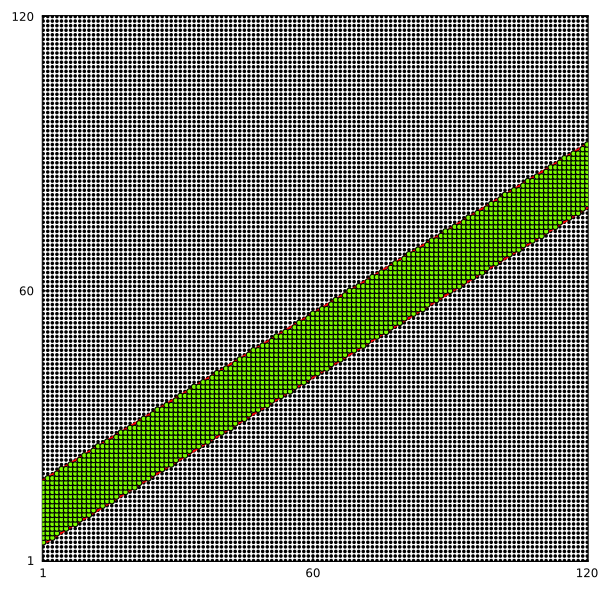

In [56]:
### PTB_index will contain ordered indices of the sites in PTB

PTB_index_dummy = collect(range(1,L^2,L^2))
for ii = 1:L^2
    if (points_y_array[ii] >= line_down(points_x_array[ii])) && (points_y_array[ii] <= line_up(points_x_array[ii]))
        ## Do nothing
    else
        PTB_index_dummy[ii] = 0.0
    end
end

## Here we store non-zero indices
PTB_index = findall(!iszero, PTB_index_dummy)

N_PTB = size(PTB_index)[1]

points_PTB_array_x = zeros(N_PTB)
points_PTB_array_y = zeros(N_PTB)

for ii = 1:N_PTB
    points_PTB_array_x[ii] = points_x_array[PTB_index[ii]]
    points_PTB_array_y[ii] = points_y_array[PTB_index[ii]]
end

### Draw lines separating PTB
line_x = [1.0,L]
line_down_y = line_down.(line_x)
line_up_y = line_up.(line_x)

plt_lattice=scatter(points_x_array, points_y_array,aspect_ratio=1,legend=false, 
                    xlims=[0.8,L+0.2], ylims=[0.8,L+0.2],color="black",markersize=2, frame=:box, framestyle=:thick, xticks=[1,Lx/2,Lx],yticks=[1,Ly/2,Ly], size=(600,600))
plt_lattice=plot!(line_x,line_down_y,color="red",width=2)
plt_lattice=plot!(line_x,line_up_y,color="red",width=2)
plt_lattice=plot!(line_x,line_middle.(line_x),color="blue",width=2)
plt_lattice=scatter!(points_PTB_array_x, points_PTB_array_y,color="lawngreen",aspect_ratio=1,legend=false,markersize=3)

## Percentage of sites in PTB

In [57]:
println("Number of sites in PTB = ",N_PTB)
println("Amount of sites in PTB = ",100* N_PTB/L^2, " %")

Number of sites in PTB = 1680
Amount of sites in PTB = 11.666666666666666 %


In [58]:
println(PTB_index)

[481, 601, 602, 603, 721, 722, 723, 724, 841, 842, 843, 844, 845, 846, 961, 962, 963, 964, 965, 966, 967, 968, 1081, 1082, 1083, 1084, 1085, 1086, 1087, 1088, 1089, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1441, 1442, 1443, 1444, 1445, 1446, 1447, 1448, 1449, 1450, 1451, 1452, 1453, 1454, 1561, 1562, 1563, 1564, 1565, 1566, 1567, 1568, 1569, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1681, 1682, 1683, 1684, 1685, 1686, 1687, 1688, 1689, 1690, 1691, 1692, 1693, 1694, 1695, 1696, 1697, 1801, 1802, 1803, 1804, 1805, 1806, 1807, 1808, 1809, 1810, 1811, 1812, 1813, 1814, 1815, 1816, 1817, 1818, 1819, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931, 1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 2041, 2042, 2043, 2044, 2045, 2046, 2047, 2048, 2049, 2050, 2051, 2052, 2053, 2054, 2055, 2056, 2057, 2058, 2059, 2060, 2061, 2062, 2162, 2163, 2164, 2165, 2166, 2167, 2168, 2

## Coordinates of projected sites

### Equation of line_down is $y=mx + c_1$
### Equation of projector line is, $y-y_1 = (-1/m).(x-x_1)$, where $(x_1,y_1)$ is the coordinate of the site
### The two lines intersect at $((m.y_1 + x_1 - m.c_1)/(m^2 + 1), (m^2.y_1 + m.x_1 + c_1)/(m^2 + 1))$

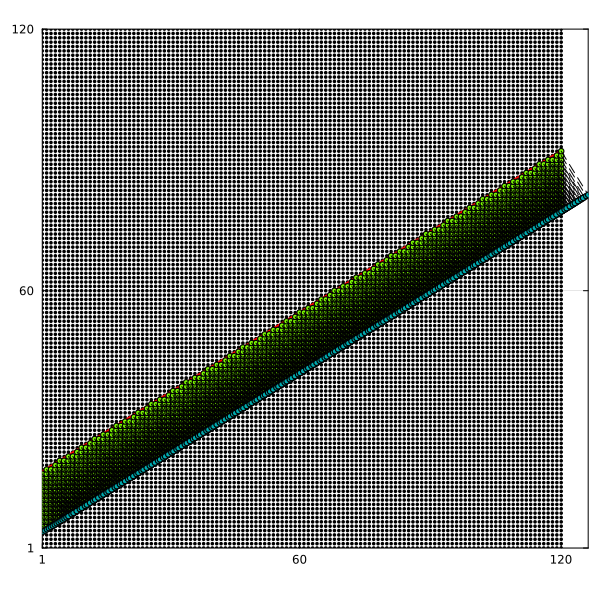

In [59]:
projected_points_PTB_array_x = (m*points_PTB_array_y + points_PTB_array_x - m*ones(N_PTB)*c1)/(m^2 + 1);
projected_points_PTB_array_y = m*projected_points_PTB_array_x + c1 * ones(N_PTB);

## This array contains distance along the line
## This should be x coordinates on the line * sec(theta), where the slope is tan(theta) = m
distance_along_projected_line = projected_points_PTB_array_x * sqrt(m^2 +1)

for ii = 1:N_PTB
    line_projected_x = [points_PTB_array_x[ii],projected_points_PTB_array_x[ii]]
    line_projected_y = [points_PTB_array_y[ii],projected_points_PTB_array_y[ii]]
    plt_lattice=plot!(line_projected_x,line_projected_y,linestyle=:dash, color="black")
end
plt_lattice=scatter!(projected_points_PTB_array_x,projected_points_PTB_array_y, 
            xlims=(1,maximum(vcat(projected_points_PTB_array_x,Lx))), ylims=(1,maximum(vcat(projected_points_PTB_array_y,Ly))), markersize=3)
display(plt_lattice)

## Generate Parent Hamiltonian

In [60]:
include("generate_matrices1D.jl")
include("generate_matrices2D.jl")
include("angmom.jl")

generate_spin_matrices (generic function with 1 method)

In [61]:
println("t = ",t)
println("t_prime = ", t_prime)
println("t_0 = ", t0)
println("m_0 = ", m_0)
println("Lx = ", Lx)
println("Ly = ", Ly)

t = 1.0
t_prime = 1.5
t_0 = 1.0
m_0 = 3
Lx = 120
Ly = 120


In [62]:
if(x_periodic^2 != x_periodic || y_periodic^2 != y_periodic)
    println("x_periodic and y_periodic must be 0 or 1")
    println("You entered x_periodic = ", x_periodic, " y_periodic = ", y_periodic)
    return
end

In [63]:

sigma_x, sigma_y, sigma_z = generate_spin_matrices(1/2)
const_2D, CX2D, SX2D, CY2D, SY2D, CXCY2D, SXCY2D, CXSY2D = generate_matrices_2D(Lx,Ly,x_periodic,y_periodic)

h_scti = t*kron((SX2D + CXSY2D),sigma_x) + t*kron(SY2D+SXCY2D,sigma_y) + kron((m_0-2*t_prime)*const_2D + t0*(CX2D + CY2D) + 2*t_prime*CXCY2D,sigma_z)
## Here is the Hamiltonian of regular Chern insulator for quick check
#h_scti = Hermitian(t*kron((SX2D),sigma_x) + t*kron(SY2D,sigma_y) + kron((m_0-2*t_prime)*const_2D + t0*(CX2D + CY2D),sigma_z))

if(Hermitian_Check(h_scti) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

Verified: Building Block Matrices are Hermitian


## Clear Variables

In [64]:
const_2D= Nothing
CX2D= Nothing
SX2D= Nothing
CY2D= Nothing
SY2D= Nothing
CXCY2D= Nothing
SXCY2D= Nothing
CXSY2D= Nothing

Nothing

### The following (commented out to save execution time) is the code for local Chern marker in the parent lattice

In [65]:
# XList_parent = kron(range(1,1,Ly),range(1,Lx,Lx))
# YList_parent = kron(range(1,Ly,Ly),range(1,1,Lx))


# X1_parent = kron(diagm(XList_parent),eye2)
# Y1_parent = kron(diagm(YList_parent),eye2)

# (energy_eigenvalues_parent, eigenstates_parent) = eigen(h_scti);
# filled_eigenstates_parent = eigenstates_parent[:,1:Lx*Ly]

# ## We create a projector P, which projects to the space of filled eigenstates (half-filled)
# P_parent = conj(filled_eigenstates_parent) * transpose(filled_eigenstates_parent)
# ## Q projects to the empty eigenstates
# Q_parent = kron(const_2D,eye2) - P_parent
# ## We define the local Chern operators, whose diagonal elements in the Wannier basis are the local Chern numbers per orbital
# ChernMatrix_parent = -4*pi*imag(P_parent * X1_parent * Q_parent * Y1_parent * P_parent);
# ChernMatrixDiagonalList_parent = diag(ChernMatrix_parent)
# ChernMatrixSiteWiseList_parent = zeros(Lx*Ly)
# ## Here we add the two chern numbers for the two orbitals
# for ii = 1:Lx*Ly
#     ChernMatrixSiteWiseList_parent[ii] = ChernMatrixDiagonalList_parent[2*(ii-1) + 1] + ChernMatrixDiagonalList_parent[2*(ii-1) + 2]
# end

# println(ChernMatrixSiteWiseList_parent)

In [66]:
# plt1 = scatter(1:2*Lx*Ly, energy_eigenvalues_parent)
# display(plt1)

In [67]:
# Gap_parent = minimum(abs.(energy_eigenvalues_parent))

### I plot the local Chern marker at the middle line $y = L_y/2$ of the lattice

In [68]:
# ### We will plot the local Chern marker along the line y = Ly/2
# plt_Chern_parent = scatter(1:Lx, ChernMatrixSiteWiseList_parent[(Int(round(Ly/2)) - 1)*Lx+1:(Int(round(Ly/2)) - 1)*Lx+Lx], ylims=(-3,3), 
#                 xlabel="x", ylabel="Perent lattice Local Chern marker at y=L/2", legend=:none,
#                 title=string("Lx = ", string(Lx), ", t = ", string(t), ", t_prime = ", string(t_prime), ", m0 = ", string(m_0)))
# display(plt_Chern_parent)

## Now generate PTB Hamiltonian

In [69]:
PTB_orbital_index = ones(2*N_PTB);
for ii = 1:N_PTB
    PTB_orbital_index[2*ii-1] = 2*PTB_index[ii]-1
    PTB_orbital_index[2*ii] = 2*PTB_index[ii]
end
println(PTB_orbital_index)

[961.0, 962.0, 1201.0, 1202.0, 1203.0, 1204.0, 1205.0, 1206.0, 1441.0, 1442.0, 1443.0, 1444.0, 1445.0, 1446.0, 1447.0, 1448.0, 1681.0, 1682.0, 1683.0, 1684.0, 1685.0, 1686.0, 1687.0, 1688.0, 1689.0, 1690.0, 1691.0, 1692.0, 1921.0, 1922.0, 1923.0, 1924.0, 1925.0, 1926.0, 1927.0, 1928.0, 1929.0, 1930.0, 1931.0, 1932.0, 1933.0, 1934.0, 1935.0, 1936.0, 2161.0, 2162.0, 2163.0, 2164.0, 2165.0, 2166.0, 2167.0, 2168.0, 2169.0, 2170.0, 2171.0, 2172.0, 2173.0, 2174.0, 2175.0, 2176.0, 2177.0, 2178.0, 2401.0, 2402.0, 2403.0, 2404.0, 2405.0, 2406.0, 2407.0, 2408.0, 2409.0, 2410.0, 2411.0, 2412.0, 2413.0, 2414.0, 2415.0, 2416.0, 2417.0, 2418.0, 2419.0, 2420.0, 2421.0, 2422.0, 2641.0, 2642.0, 2643.0, 2644.0, 2645.0, 2646.0, 2647.0, 2648.0, 2649.0, 2650.0, 2651.0, 2652.0, 2653.0, 2654.0, 2655.0, 2656.0, 2657.0, 2658.0, 2659.0, 2660.0, 2661.0, 2662.0, 2663.0, 2664.0, 2881.0, 2882.0, 2883.0, 2884.0, 2885.0, 2886.0, 2887.0, 2888.0, 2889.0, 2890.0, 2891.0, 2892.0, 2893.0, 2894.0, 2895.0, 2896.0, 2897.0, 2

In [70]:
outside_orbital_index = setdiff(1:2*Lx*Ly,PTB_orbital_index);
println(outside_orbital_index)

[1.0, 2.0, 3.0, 4.0, 5.0, 6.0, 7.0, 8.0, 9.0, 10.0, 11.0, 12.0, 13.0, 14.0, 15.0, 16.0, 17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0, 80.0, 81.0, 82.0, 83.0, 84.0, 85.0, 86.0, 87.0, 88.0, 89.0, 90.0, 91.0, 92.0, 93.0, 94.0, 95.0, 96.0, 97.0, 98.0, 99.0, 100.0, 101.0, 102.0, 103.0, 104.0, 105.0, 106.0, 107.0, 108.0, 109.0, 110.0, 111.0, 112.0, 113.0, 114.0, 115.0, 116.0, 117.0, 118.0, 119.0, 120.0, 121.0, 122.0, 123.0, 124.0, 125.0, 126.0, 127.0, 128.0, 129.0, 130.0, 131.0, 132.0, 133.0, 134.0, 135.0, 136.0, 137.0, 138.0, 139.0, 140.0, 141.0, 142.0, 143.0, 144.0, 145.0, 146.0, 147.0, 148.0, 149.0, 150.0, 151.0, 152.0, 153.0, 154.0, 155.0, 156.0, 157.0, 158.0, 1

In [71]:
NOrbitalsOutside = 2*Lx*Ly - 2*N_PTB

25440

In [72]:
NOrbitalsInside = 2*N_PTB

3360

In [73]:
H_PTB_renor = zeros(NOrbitalsInside,NOrbitalsInside)*im;

H_11 = zeros(NOrbitalsInside,NOrbitalsInside)*im;

H_22 = zeros(NOrbitalsOutside,NOrbitalsOutside)*im;

H_21 = zeros(NOrbitalsOutside,NOrbitalsInside)*im;

H_12 = zeros(NOrbitalsInside,NOrbitalsOutside)*im;

In [74]:
for ii = 1:NOrbitalsInside
    for jj = 1:NOrbitalsInside
        H_11[ii,jj] = h_scti[Int(PTB_orbital_index[ii]), Int(PTB_orbital_index[jj])]
    end
end

In [75]:
# Threads.@threads for ii = 1:NOrbitalsOutside
#     for jj = 1:NOrbitalsOutside
#         H_22[ii,jj] = h_scti[Int(outside_orbital_index[ii]), Int(outside_orbital_index[jj])]
#     end
# end

In [76]:
# Threads.@threads for ii = 1:NOrbitalsInside
#     for jj = 1:NOrbitalsOutside
#         H_12[ii,jj] = h_scti[Int(PTB_orbital_index[ii]), Int(outside_orbital_index[jj])]
#     end
# end

In [77]:
# Threads.@threads for ii = 1:NOrbitalsOutside
#     for jj = 1:NOrbitalsInside
#         H_21[ii,jj] = h_scti[Int(outside_orbital_index[ii]), Int(PTB_orbital_index[jj])]
#     end
# end

## Clear variables

In [78]:
h_scti= Nothing

Nothing

## Add a small constant matrix to invert matrix H_22 in case its eigenvalue is 0

In [79]:
H_PTB_renor = H_11 #- Hermitian(H_12*inv(Hermitian(H_22 + 10^(-8)*Matrix(1.0I, NOrbitalsOutside, NOrbitalsOutside)))*H_21);

3360×3360 Matrix{ComplexF64}:
   0.0+0.0im       0.0+0.0im    …     0.0+0.0im       0.0+0.0im
   0.0+0.0im       0.0+0.0im          0.0+0.0im       0.0+0.0im
  0.25+0.0im     -0.25+0.0im          0.0+0.0im       0.0+0.0im
  0.25+0.0im     -0.25+0.0im          0.0+0.0im       0.0+0.0im
 0.375-0.0im    -0.125-0.125im        0.0+0.0im       0.0+0.0im
 0.125-0.125im  -0.375-0.0im    …     0.0+0.0im       0.0+0.0im
   0.0+0.0im       0.0+0.0im          0.0+0.0im       0.0+0.0im
   0.0+0.0im       0.0+0.0im          0.0+0.0im       0.0+0.0im
   0.0+0.0im       0.0+0.0im          0.0+0.0im       0.0+0.0im
   0.0+0.0im       0.0+0.0im          0.0+0.0im       0.0+0.0im
      ⋮                         ⋱                  
   0.0+0.0im       0.0+0.0im          0.0+0.0im       0.0+0.0im
   0.0+0.0im       0.0+0.0im          0.0+0.0im       0.0+0.0im
   0.0+0.0im       0.0+0.0im          0.0+0.0im       0.0+0.0im
   0.0+0.0im       0.0+0.0im        0.375+0.0im     0.125+0.125im
   0.0+0.0im       0

In [80]:
H_11= Nothing
H_12= Nothing
H_21= Nothing
H_22= Nothing

Nothing

In [81]:
if(Hermitian_Check(H_PTB_renor) == false)
    println("Error! Hamiltonian is not Hermitian")
    return
end

### Calculation of local Chern Marker

In [82]:
## Store the x and y coordinates of the sites in PTB
YList_PTB = ceil.(PTB_index/Lx);
XList_PTB = PTB_index - (YList_PTB - ones(N_PTB))*Lx;

In [83]:
## Kronecker product to get the orbitals
XListKron_PTB = kron(XList_PTB,[1,1]);
YListKron_PTB = kron(YList_PTB,[1,1]);

X1_PTB = diagm(XListKron_PTB);
Y1_PTB = diagm(YListKron_PTB);

In [84]:
(energy_eigenvalues_PTB, eigenstates_PTB) = eigen(H_PTB_renor);
#println(size(eigenstates))
filled_eigenstates_PTB = eigenstates_PTB[:,1:N_PTB]
## We create a projector P, which projects to the space of filled eigenstates (half-filled)
P_PTB = conj(filled_eigenstates_PTB) * transpose(filled_eigenstates_PTB)
## Q projects to the empty eigenstates
Q_PTB = kron(diagm(ones(N_PTB)),eye2) - P_PTB
## We define the local Chern operators, whose diagonal elements in the Wannier basis are the local Chern numbers per orbital
ChernMatrix_PTB = -4*pi*imag(P_PTB * X1_PTB * Q_PTB * Y1_PTB * P_PTB);
ChernMatrixDiagonalList_PTB = diag(ChernMatrix_PTB)
ChernMatrixSiteWiseList_PTB = zeros(Lx*Ly)
## Here we add the two chern numbers for the two orbitals
for ii = 1:N_PTB
    ChernMatrixSiteWiseList_PTB[ii] = ChernMatrixDiagonalList_PTB[2*(ii-1) + 1] + ChernMatrixDiagonalList_PTB[2*(ii-1) + 2]
end

In [85]:
Gap_PTB = 2*minimum(abs.(energy_eigenvalues_PTB))

0.0006302022786743905

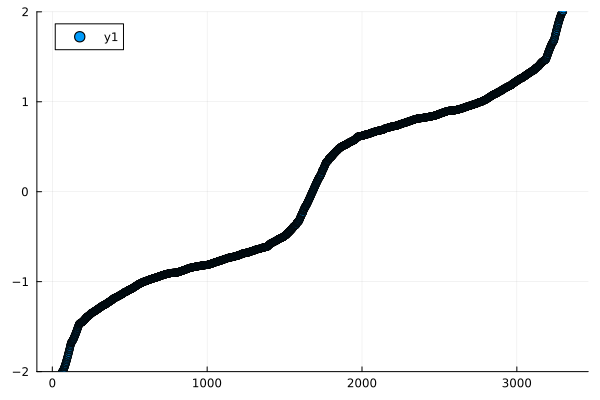

In [86]:
plt2 = scatter(1:NOrbitalsInside, energy_eigenvalues_PTB, ylims=(-2,2))
display(plt2)

In [87]:
function state_to_real_space_LDoS(v::Array{ComplexF64})
    n_sites = Int(size(v)[1]/2)
    prob_dist = zeros(n_sites)
    for ii = 1:n_sites
        prob_dist[ii] = abs(v[2*ii-1])^2 +  abs(v[2*ii])^2
    end
    return prob_dist
end 

state_to_real_space_LDoS (generic function with 1 method)

## Plot of LDoS of topological states of PTB

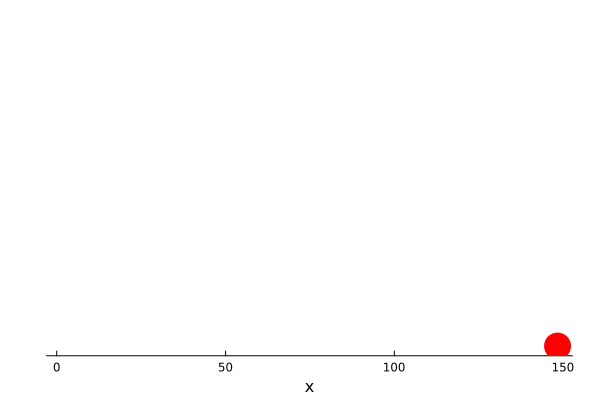

In [88]:
#boundary_state_nearest_zero = eigenstates_PTB[:,N_PTB];
probability_boundary_state = state_to_real_space_LDoS(eigenstates_PTB[:,N_PTB]) + state_to_real_space_LDoS(eigenstates_PTB[:,N_PTB+1]);

color_map = cgrad([RGB(1,1,1), RGB(0,0,1), RGB(1,0,0)])

# Calculate alphas based on y values
function alpha_function(p, pmax)
    if p < pmax/10
        return 0
    else
        return p/pmax
    end
end
alphas = alpha_function.(probability_boundary_state, maximum(probability_boundary_state))

#plt_PTB_BD_states = scatter(distance_along_projected_line, probability_boundary_state)
plt_PTB_BD_states = scatter(distance_along_projected_line, ones(N_PTB), 
                            zcolor=probability_boundary_state, legend=false, xlabel="x", colorbar_title="Value",
                            c=color_map, ms=15, seriesalpha=alphas, markerstrokewidth=0, grid=false,
                            yaxis=false)

display(plt_PTB_BD_states)

In [89]:
maximum(probability_boundary_state)

0.17908308432222192

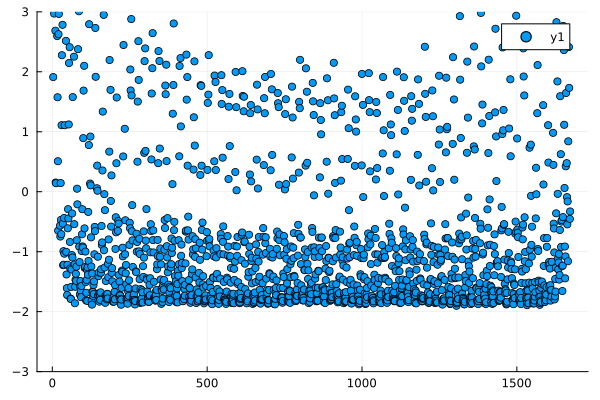

In [90]:
plt_PTB_Chern_marker_sitewise = scatter(1:N_PTB, ChernMatrixSiteWiseList_PTB,ylims=(-3,3),yticks=range(-3,3,7))

### Now I isolate sites on the middle line, and plot their local Chern markers

### For each value of x, I find the site on the PTB closest to the middle line

#### Note that this works only if PTB is thick enough to have more than Lx points

In [91]:
### I generate an array which are the points closest to the middle line
middle_line_x_coordinates = 1:Lx;
middle_line_y_coordinates = round.(line_middle.(float(middle_line_x_coordinates)));

In [92]:
Indices_of_PTB_middle_points = zeros(Lx);
Chern_marker_PTB_list_middle_points = zeros(Lx);

for ii = 1:Lx
    for jj = 1:N_PTB
        if (XList_PTB[jj] == middle_line_x_coordinates[ii]) && (YList_PTB[jj] == middle_line_y_coordinates[ii])
            Indices_of_PTB_middle_points[ii] = PTB_index[jj];
            Chern_marker_PTB_list_middle_points[ii] = ChernMatrixSiteWiseList_PTB[jj];
        end
    end
end


In [93]:
mode_chern = modes(round.(Chern_marker_PTB_list_middle_points))[1]

-2.0

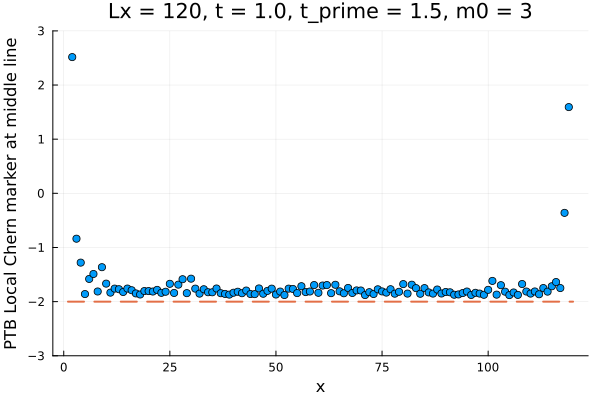

In [94]:
### We will plot the local Chern marker along the line y = Ly/2
plt_Chern_PTB = scatter(1:Lx, Chern_marker_PTB_list_middle_points, ylims=(-3,3), legend=:none,
                xlabel="x", ylabel="PTB Local Chern marker at middle line", 
                title=string("Lx = ", string(Lx), ", t = ", string(t), ", t_prime = ", string(t_prime), ", m0 = ", string(m_0)))
plt_Chern_PTB = plot!(1:Lx, mode_chern*ones(Lx), linestyle=:dash, thickness=2, linewidth=2)
display(plt_Chern_PTB)

In [95]:
# Define the folder path (relative or absolute)
folder_path = "data/hstci/"  # Change to your desired folder
# Ensure the folder exists
isdir(folder_path) || mkdir(folder_path)

filename = "H11_only_t0=$(t0)_t=$(t)_t_prime=$(t_prime)_m_0=$(m_0)_x_periodic=$(x_periodic)_y_periodic=$(y_periodic)_L=$(L)_m=$(m)_c1=$(c1)_c2=$(c2).csv"

"H11_only_t0=1.0_t=1.0_t_prime=1.5_m_0=3_x_periodic=0_y_periodic=0_L=120_m=0.6180339887498949_c1=4_c2=18.csv"

In [96]:
isdir(string(folder_path,"energies/")) || mkdir(string(folder_path,"energies/"))

if exportdata==1
    CSV.write(string(folder_path,"energies/",filename), (; energy_eigenvalues_PTB),writeheader=false)
end

In [97]:
isdir(string(folder_path,"LDOS/")) || mkdir(string(folder_path,"LDOS/"))

if exportdata==1
    CSV.write(string(folder_path,"LDOS/",filename), (; probability_boundary_state),writeheader=false)
end

In [98]:
isdir(string(folder_path,"local_chern/")) || mkdir(string(folder_path,"local_chern/"))

if exportdata==1
    CSV.write(string(folder_path,"local_chern/",filename), (; Chern_marker_PTB_list_middle_points),writeheader=false)
end

In [99]:
t_end=time();
println("time taken = ", t_end - t_start," seconds")

time taken = 153.46680188179016 seconds
